<a href="https://colab.research.google.com/github/jacquelinepalumbo/Sprint2_MVP/blob/master/DL_PenguinsvsTurts_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **Classificador de imagens binária - Pinguins VS Tartarugas**

Temos um conjunto de imagens que representam duas categorias de animais: pinguins e tartarugas. O objetivo deste notebook é criar um modelo de visão computacional que consiga classificar uma imagem em alguma das categorias mencionadas acima.

# Importando as bibliotecas necessárias para executar o notebook

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO
import numpy as np
import pandas as pd
import seaborn as sns
import PIL
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
import time
import os
import urllib.request
from IPython.display import Image
from sklearn.model_selection import train_test_split
import shutil
import random
import math
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report
import os
import zipfile
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from datetime import datetime
from tensorflow import keras
import sklearn.metrics as skm
import itertools

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.12.0
The following GPU devices are available: 


# Importando os datasets

Sobre o conjunto de dados 572 imagens únicas, divididas em uma pasta de treinamento de 500 imagens e uma pasta de validação de 72 imagens. O conjunto de dados é dividido 50:50 entre imagens de tartarugas e pinguins. Cada imagem contém exatamente uma instância de um objeto. As informações de anotação que acompanham a lista são apresentadas por dicionários. Os IDs de categoria incluem 1 (pinguim) e 2 (tartaruga).

In [28]:
# Carregando dataset de treino
train_model = pd.read_json("https://raw.githubusercontent.com/jacquelinepalumbo/Sprint2_MVP/master/train_annotations")
train_model.head()

,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,1,"[119, 25, 205, 606]",124230,[],0
1,1,1,1,"[131, 82, 327, 440]",143880,[],0
2,2,2,2,"[225, 298, 198, 185]",36630,[],0
3,3,3,2,"[468, 109, 172, 193]",33196,[],0
4,4,4,1,"[14, 242, 611, 154]",94094,[],0


In [29]:
# Carregando dataset de validação
valid_model = pd.read_json("https://raw.githubusercontent.com/jacquelinepalumbo/Sprint2_MVP/master/valid_annotations")
valid_model.head()

,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,1,"[227, 93, 298, 525]",156450,[],0
1,1,1,2,"[211, 198, 428, 259]",110852,[],0
2,2,2,2,"[0, 243, 512, 267]",136704,[],0
3,3,3,1,"[128, 178, 457, 354]",161778,[],0
4,4,4,1,"[168, 131, 296, 469]",138824,[],0


In [30]:
# Importando Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [31]:
# importando pasta de imagens treino
train_image= '/content/drive/MyDrive/MLPenguins_vs_Turtles/train/train'

In [32]:
# Exibindo quantidade de imagens
print(f"Temos um total de {len(os.listdir(train_image))} imagens para a treinamento do modelo")

Temos um total de 500 imagens para a treinamento do modelo


In [33]:
# Exibindo as imagens para a validação
os.listdir(train_image)

['image_id_016.jpg',
 'image_id_000.jpg',
 'image_id_006.jpg',
 'image_id_027.jpg',
 'image_id_001.jpg',
 'image_id_013.jpg',
 'image_id_004.jpg',
 'image_id_015.jpg',
 'image_id_010.jpg',
 'image_id_003.jpg',
 'image_id_017.jpg',
 'image_id_021.jpg',
 'image_id_012.jpg',
 'image_id_008.jpg',
 'image_id_005.jpg',
 'image_id_023.jpg',
 'image_id_011.jpg',
 'image_id_009.jpg',
 'image_id_007.jpg',
 'image_id_028.jpg',
 'image_id_022.jpg',
 'image_id_024.jpg',
 'image_id_019.jpg',
 'image_id_029.jpg',
 'image_id_018.jpg',
 'image_id_026.jpg',
 'image_id_014.jpg',
 'image_id_025.jpg',
 'image_id_002.jpg',
 'image_id_020.jpg',
 'image_id_062.jpg',
 'image_id_070.jpg',
 'image_id_036.jpg',
 'image_id_032.jpg',
 'image_id_071.jpg',
 'image_id_060.jpg',
 'image_id_050.jpg',
 'image_id_056.jpg',
 'image_id_046.jpg',
 'image_id_047.jpg',
 'image_id_053.jpg',
 'image_id_030.jpg',
 'image_id_059.jpg',
 'image_id_044.jpg',
 'image_id_063.jpg',
 'image_id_069.jpg',
 'image_id_057.jpg',
 'image_id_03

In [34]:
# importando pasta de imagens de validação
valid_image= '/content/drive/MyDrive/MLPenguins_vs_Turtles/valid/valid'

In [35]:
# Exibindo quantidade de imagens
print(f"Temos um total de {len(os.listdir(valid_image))} imagens para a validação do modelo")

Temos um total de 72 imagens para a validação do modelo


In [36]:
# Exibindo as imagens para a validação
os.listdir(valid_image)

['image_id_001.jpg',
 'image_id_002.jpg',
 'image_id_000.jpg',
 'image_id_027.jpg',
 'image_id_034.jpg',
 'image_id_022.jpg',
 'image_id_003.jpg',
 'image_id_032.jpg',
 'image_id_039.jpg',
 'image_id_018.jpg',
 'image_id_035.jpg',
 'image_id_011.jpg',
 'image_id_037.jpg',
 'image_id_015.jpg',
 'image_id_024.jpg',
 'image_id_031.jpg',
 'image_id_033.jpg',
 'image_id_030.jpg',
 'image_id_029.jpg',
 'image_id_036.jpg',
 'image_id_042.jpg',
 'image_id_021.jpg',
 'image_id_007.jpg',
 'image_id_041.jpg',
 'image_id_020.jpg',
 'image_id_026.jpg',
 'image_id_008.jpg',
 'image_id_013.jpg',
 'image_id_017.jpg',
 'image_id_044.jpg',
 'image_id_043.jpg',
 'image_id_014.jpg',
 'image_id_006.jpg',
 'image_id_005.jpg',
 'image_id_038.jpg',
 'image_id_019.jpg',
 'image_id_045.jpg',
 'image_id_028.jpg',
 'image_id_009.jpg',
 'image_id_010.jpg',
 'image_id_025.jpg',
 'image_id_040.jpg',
 'image_id_016.jpg',
 'image_id_004.jpg',
 'image_id_023.jpg',
 'image_id_012.jpg',
 'image_id_046.jpg',
 'image_id_06

# Tratamento dos dados

In [37]:
# Exibindo as categorias
print('Classes of train_model: ', train_model['category_id'].unique()) # dataset treino
print('Classes of val_model: ', valid_model['category_id'].unique()) # dataser validação

Classes of train_model:  [1 2]
Classes of val_model:  [1 2]


In [38]:
# Removendo outras colunas do dataset treino e teste DROP
train_model.drop(['id', 'bbox', 'area', 'segmentation', 'iscrowd'], axis =1, inplace=True)
valid_model.drop(['id', 'bbox', 'area', 'segmentation', 'iscrowd'], axis =1, inplace=True)

In [39]:
# Renomeando Classe 1 e 2 para Penguin e Turtle, respectivamente
train_model['category_id']=train_model['category_id'].replace({1:'Penguin',2:'Turtle'}) # dataset treino
valid_model['category_id']=valid_model['category_id'].replace({1:'Penguin',2:'Turtle'}) # dataset validação

In [40]:
# Renomeando as colunas
train_model.columns=['id_images', 'Classification']
valid_model.columns=['id_images', 'Classification']

In [41]:
# Exibindo dataset treino
train_model

,id_images,Classification
0,0,Penguin
1,1,Penguin
2,2,Turtle
3,3,Turtle
4,4,Penguin
...,...,...
495,495,Turtle
496,496,Penguin
497,497,Penguin
498,498,Penguin


In [42]:
# Exibindo dataset validação
valid_model

,id_images,Classification
0,0,Penguin
1,1,Turtle
2,2,Turtle
3,3,Penguin
4,4,Penguin
...,...,...
67,67,Turtle
68,68,Penguin
69,69,Penguin
70,70,Turtle


In [43]:
# Criando um caminho completo para o arquivo de imagem train_image
train_image=r'/content/drive/MyDrive/MLPenguins_vs_Turtles/train/train'
train_imglist=sorted(os.listdir(train_image))
train_paths=[] # inserindo em uma lista
for i in range (len(train_imglist)):
    train_paths.append(os.path.join(train_image, train_imglist[i]))
print (train_paths[0])

/content/drive/MyDrive/MLPenguins_vs_Turtles/train/train/image_id_000.jpg


In [44]:
# Inserindo o caminho das imagens para o nosso modelo train_model
train_model['id_images']=train_paths
train_df = train_model
train_df

,id_images,Classification
0,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Penguin
1,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Penguin
2,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Turtle
3,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Turtle
4,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Penguin
...,...,...
495,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Turtle
496,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Penguin
497,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Penguin
498,/content/drive/MyDrive/MLPenguins_vs_Turtles/t...,Penguin


In [45]:
# Criando um caminho completo para o arquivo de imagem valid_image
valid_image=r'/content/drive/MyDrive/MLPenguins_vs_Turtles/valid/valid'
val_imglist=sorted(os.listdir(valid_image))
val_paths=[]
for i in range (len(val_imglist)):
    val_paths.append(os.path.join(valid_image, val_imglist[i]))
print (val_paths[0])

/content/drive/MyDrive/MLPenguins_vs_Turtles/valid/valid/image_id_000.jpg


In [46]:
# Inserindo o caminho das imagens para o nosso modelo valid_model
valid_model['id_images']= val_paths
val_df = valid_model
val_df

,id_images,Classification
0,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Penguin
1,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Turtle
2,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Turtle
3,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Penguin
4,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Penguin
...,...,...
67,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Turtle
68,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Penguin
69,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Penguin
70,/content/drive/MyDrive/MLPenguins_vs_Turtles/v...,Turtle


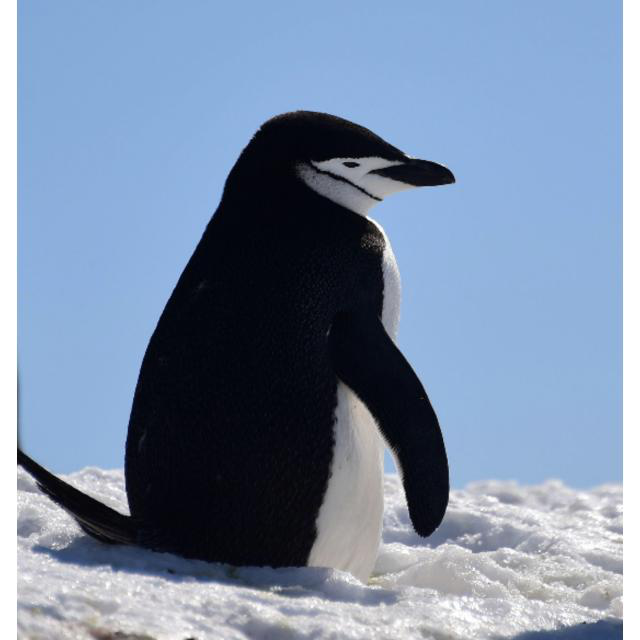

In [47]:
# Exibindo uma imagem do modelo de treino
PIL.Image.open("/content/drive/MyDrive/MLPenguins_vs_Turtles/train/train/image_id_005.jpg")

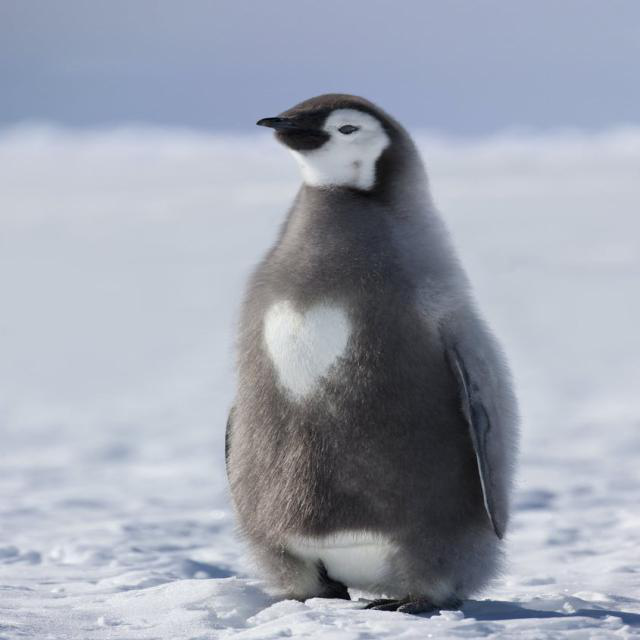

In [48]:
# Exibindo uma imagem do modelo de validação
PIL.Image.open("/content/drive/MyDrive/MLPenguins_vs_Turtles/valid/valid/image_id_000.jpg")

In [49]:
# Varificando o balanceamento dos dados [Classification] no dataset
balance= list(train_model['Classification'].value_counts())
balance

[250, 250]

Penguin    250
Turtle     250
Name: Classification, dtype: int64


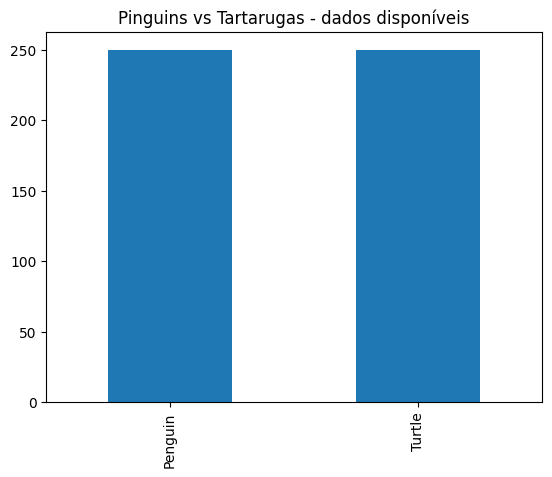

In [50]:
# Visualização do número de imagens por classe
print((train_model['Classification']).value_counts())
penguinVSturtle_count = train_model['Classification'].value_counts().plot.bar(title='Pinguins vs Tartarugas - dados disponíveis')

# Machine Learning

Iremos realizar o split do dataset de treino. A divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem poussir nenhum elemento em comum.

In [51]:
# Holdout com estratificação
train_df, test_df =train_test_split(train_df[['id_images' , 'Classification']] ,test_size=0.3 ,random_state=42 , shuffle=True, stratify=train_model['Classification'])

In [52]:
# Exibindo quantidade de dados
print ('Tamanho do nosso treino(train): ', len(train_df), ' Tamanho do nosso teste(test):: ', len(test_df), '  Tamanho da nossa validação(valid_model): ', len(val_df))

Tamanho do nosso treino(train):  350  Tamanho do nosso teste(test)::  150   Tamanho da nossa validação(valid_model):  72


In [53]:
#Visualizando a divisão dos dados treino X teste
print("##### Train: #####")
print(train_df)
print("##### Test: #####")
print(test_df)

##### Train: #####
                                             id_images Classification
408  /content/drive/MyDrive/MLPenguins_vs_Turtles/t...         Turtle
202  /content/drive/MyDrive/MLPenguins_vs_Turtles/t...        Penguin
405  /content/drive/MyDrive/MLPenguins_vs_Turtles/t...        Penguin
36   /content/drive/MyDrive/MLPenguins_vs_Turtles/t...        Penguin
45   /content/drive/MyDrive/MLPenguins_vs_Turtles/t...        Penguin
..                                                 ...            ...
112  /content/drive/MyDrive/MLPenguins_vs_Turtles/t...        Penguin
11   /content/drive/MyDrive/MLPenguins_vs_Turtles/t...         Turtle
175  /content/drive/MyDrive/MLPenguins_vs_Turtles/t...         Turtle
441  /content/drive/MyDrive/MLPenguins_vs_Turtles/t...        Penguin
452  /content/drive/MyDrive/MLPenguins_vs_Turtles/t...        Penguin

[350 rows x 2 columns]
##### Test: #####
                                             id_images Classification
317  /content/drive/MyDrive/M

# Preparação dos dados



`ImageDataGenerato`r é uma classe utilitária fornecida pelo TensorFlow para aumentar e pré-processar dados de imagens. É comumente usada em tarefas de deep learning, especialmente para classificação de imagens, para gerar imagens aumentadas (data augmentation) sob demanda durante o treinamento do modelo.

Utilizamos ainda o `ImageDataGenerator` para separar um conjunto de validação com 20% das amostras do conjunto de treino. É importante que o conjunto de validação não contenha as imagens de teste, tendo em vista que elas não deveriam ser conhecidas no momento do treinamento.

Veja que neste caso é usado o método `flow_from_dataframe()` para gerar imagens aumentadas a partir de um dataframe que aponta para as imagens originais. O método recebe parâmetros como o dataframe, o diretório com as imagens, o tamanho do lote (batch size) e o modo de classe (neste caso, binário porque são apenas duas classes), entre outros.

In [56]:
# generator para o treino e validação
train_datagen=ImageDataGenerator(validation_split=0.2, #conjunto de validação com 20% das amostras do conjunto de treino
                                 rescale = 1.0/255,  # redimensiona uma imagem por um determinado fator de dimensionamento.
                                 rotation_range=40, # rotação da angulação da imagem
                                 shear_range=0.2, # imagem será distorcida ao longo de um eixo, para criar ou retificar os ângulos de percepção
                                 zoom_range=0.2, # gerar imagens com diferentes níveis de zoom para alimentar nosso modelo de aprendizado profundo.
                                 horizontal_flip=True, # inverterão os pixels
                                 fill_mode='nearest') # Pontos fora dos limites da entrada são preenchidos de acordo com o modo dado: colado


test_datagen=ImageDataGenerator(rescale=1./255)# generator para teste

train_generator=train_datagen.flow_from_dataframe(
    train_df,
    target_size=(150,150),
    batch_size=50,
    seed=13,
    class_mode='binary',
    x_col='id_images',
    y_col='Classification',
    subset='training' # Treino
    )

val_generator=train_datagen.flow_from_dataframe(
    val_df,
    target_size=(150,150),
    batch_size=50,
    seed=13,
    class_mode='binary',
    x_col='id_images',
    y_col='Classification',
    subset='validation' # Validação
    )

test_generator=test_datagen.flow_from_dataframe(
    test_df,
    target_size=(150,150),
    batch_size=50,
    seed=13,
    class_mode='binary',
    x_col='id_images',
    y_col='Classification' # Teste
    )





Found 280 validated image filenames belonging to 2 classes.
Found 14 validated image filenames belonging to 2 classes.
Found 150 validated image filenames belonging to 2 classes.


Found 1 validated image filenames belonging to 1 classes.


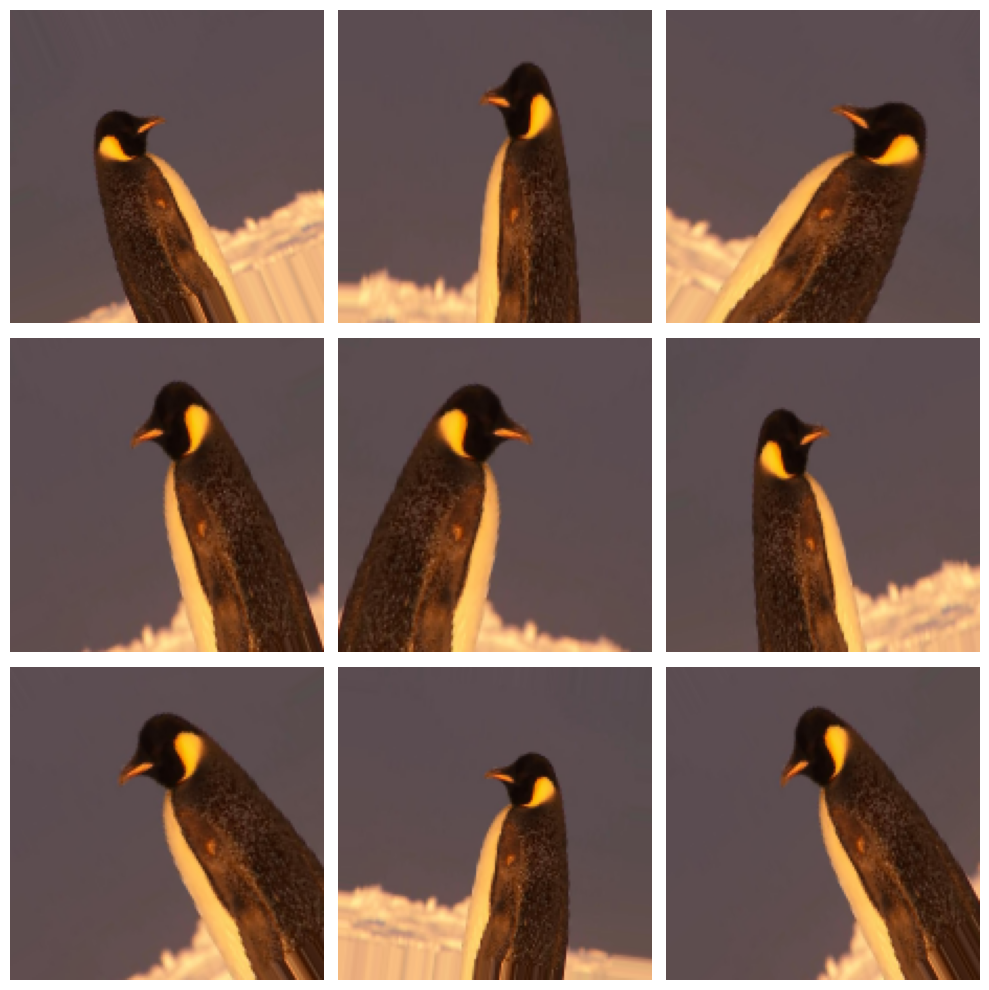

In [57]:
# Pegando um registro do dataframe de treino
sample = train_df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    x_col='id_images',
    y_col='Classification',
    target_size=(150,150),
    seed=13,
    class_mode='categorical'
)

# Exibindo as imagens
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

# Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras

**Definição da arquitetura do modelo**:
Aqui é especificada uma camada convolucional 2D que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação ReLU. O parâmetro `input_shape` define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas max-pooling com a mesma função de ativação.

Com o ReLU como função de ativação, a função retorna valores positivos, mas não retorna valores negativos, retornando zero se a entrada negativa se aplicar. A função de ativação é responsável por processar entradas ponderadas e ajudar a entregar uma saída.

In [58]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [59]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

A funçõe `sigmoid` pode ser usada como uma função de ativação em uma rede neural artificial.
A função sigmoide colocada como a última camada de um modelo de aprendizado de máquina pode servir para converter a saída do modelo em uma pontuação de probabilidade, que pode ser mais fácil de trabalhar e interpretar.

O método `summary()` é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [60]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

#  Treinamento do modelo de deep learning

**Compilação do modelo Keras com as configurações do treinamento**

`optimizer='adam'`: especifica o otimizador a ser usado durante o treinamento.

`loss='binary_crossentropy'`: especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação binária, onde a variável alvo tem apenas duas categorias, a perda binária de entropia cruzada é freqüentemente empregada.

`metrics=['accuracy']`: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [61]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método `fit_generator()` inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento `train_generator` e o gerador de dados de validação `val_generator.`

In [62]:
history=model.fit_generator(train_generator,#treino
                            epochs=20,
                            verbose=1,
                            validation_data=val_generator, #validação
                            validation_steps=None,
                            shuffle=True,
                            initial_epoch=0

)

<ipython-input-62-f6149046318a>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator,#treino


Epoch 1/20
6/6 [==============================] - 119s 20s/step - loss: 0.7881 - accuracy: 0.5286 - val_loss: 0.6903 - val_accuracy: 0.5000
Epoch 2/20
6/6 [==============================] - 19s 3s/step - loss: 0.6862 - accuracy: 0.5786 - val_loss: 0.7057 - val_accuracy: 0.5000
Epoch 3/20
6/6 [==============================] - 19s 3s/step - loss: 0.7032 - accuracy: 0.5036 - val_loss: 0.6893 - val_accuracy: 0.5000
Epoch 4/20
6/6 [==============================] - 21s 3s/step - loss: 0.6762 - accuracy: 0.5000 - val_loss: 0.6552 - val_accuracy: 0.5000
Epoch 5/20
6/6 [==============================] - 30s 4s/step - loss: 0.6537 - accuracy: 0.6536 - val_loss: 0.5872 - val_accuracy: 0.7857
Epoch 6/20
6/6 [==============================] - 25s 3s/step - loss: 0.6552 - accuracy: 0.6071 - val_loss: 0.6422 - val_accuracy: 0.7143
Epoch 7/20
6/6 [==============================] - 19s 3s/step - loss: 0.6362 - accuracy: 0.6179 - val_loss: 0.6345 - val_accuracy: 0.7857
Epoch 8/20
6/6 [================

## Plotando precisão e perda de treinamento e validação

<function matplotlib.pyplot.show(close=None, block=None)>

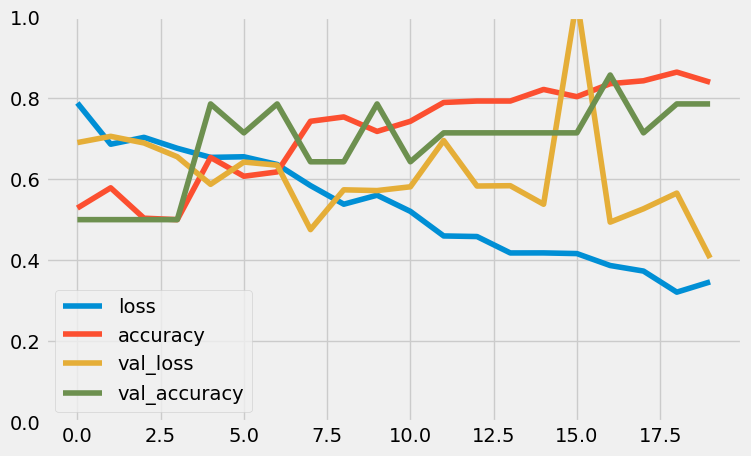

In [72]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show

Nosso modelo de treino e validação não apresentaram precisão e perdas fidedignas. Modelo deveria melhorar seus hiperparâmetros para melhor performance.

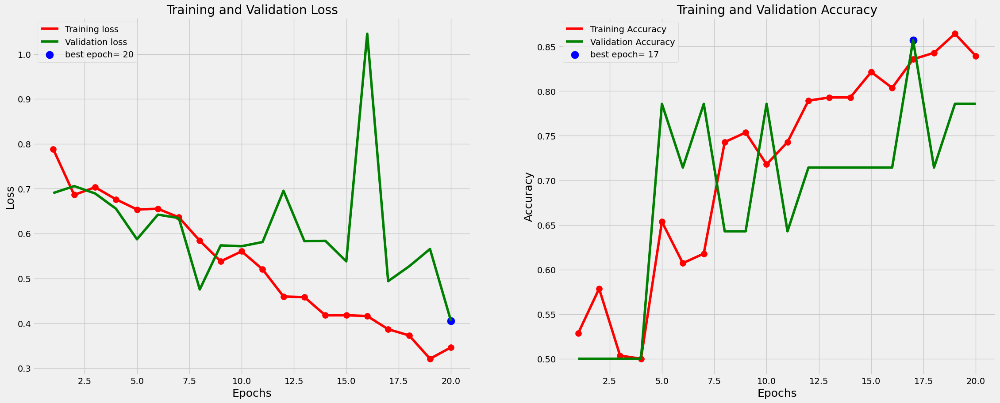

In [73]:
# Definindo uma função para plotar os dados de treinamento
def tr_plot(tr_data):
    start_epoch=0
    #Plotando os dados de treinamento e validação
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)
    index_loss=np.argmin(vloss) # |Esta é a época com a menor perda de validação
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(25,10))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].scatter(Epochs, tloss, s=100, c='red')
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs', fontsize=18)
    axes[0].set_ylabel('Loss', fontsize=18)
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].scatter(Epochs, tacc, s=100, c='red')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs', fontsize=18)
    axes[1].set_ylabel('Accuracy', fontsize=18)
    axes[1].legend()
    plt.tight_layout
    plt.show()
    return

tr_plot(history)

Nosso gráfico apresenta que a menor perda foi na 20º época e que a melhor acurácia foi na 17º época do nosso modelo de validação


# Execução do modelo treinado em um subconjunto das imagens de teste

2/2 [==============================] - 1s 235ms/step


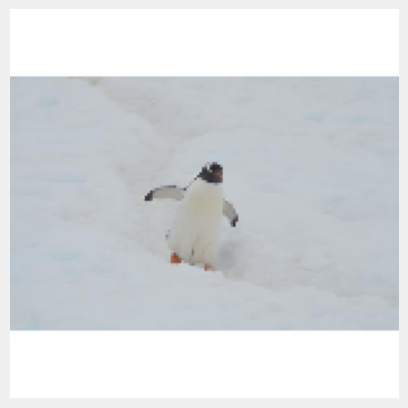

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.08119244


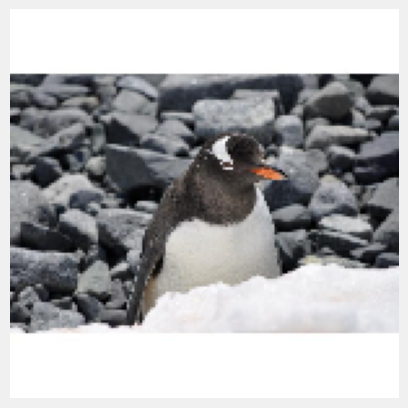

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.32248884


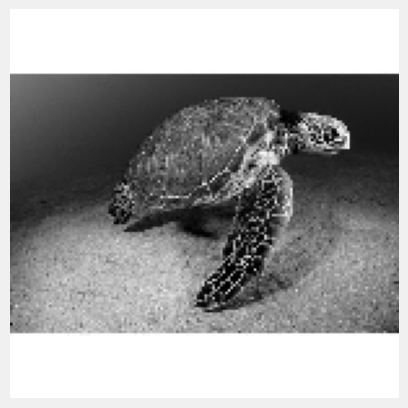

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99658275


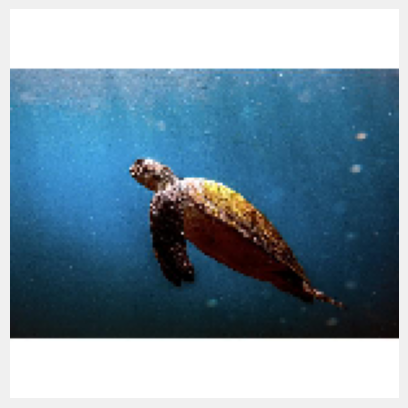

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99492484


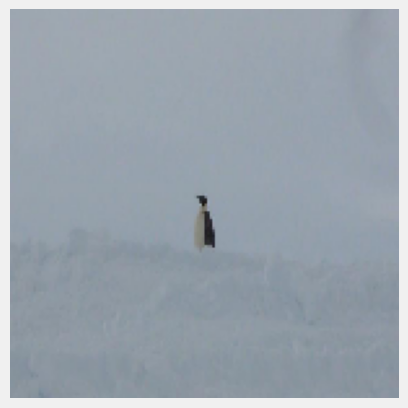

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.05033308


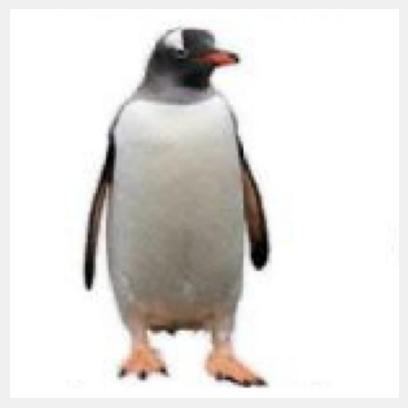

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.138343


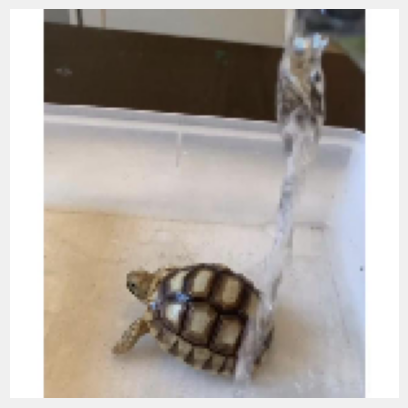

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.001389061


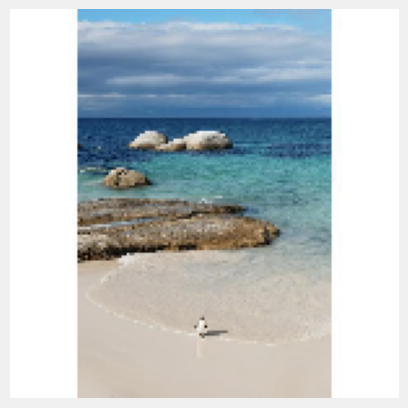

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.94158053


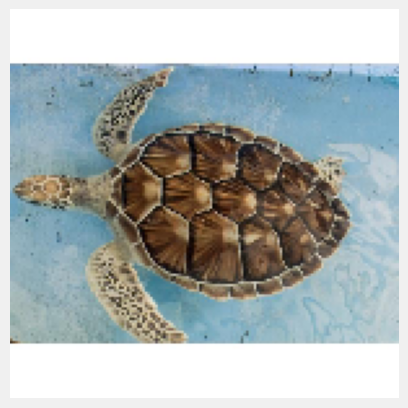

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9793822


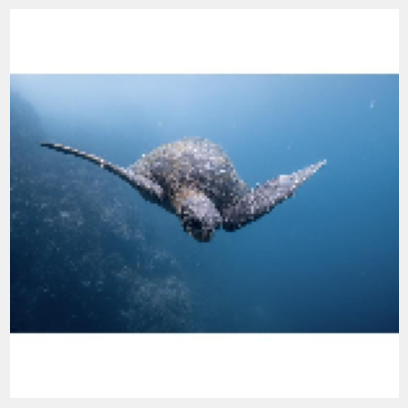

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.6725509


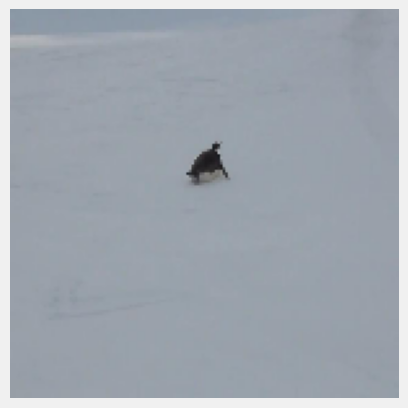

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.023806864


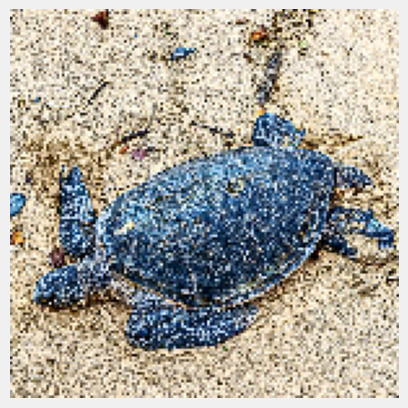

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9870824


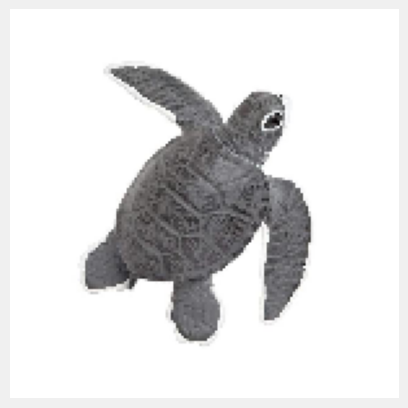

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.62031484


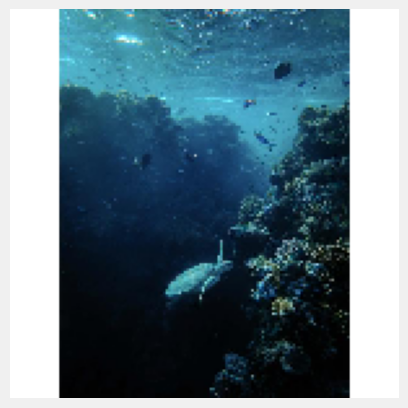

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9772232


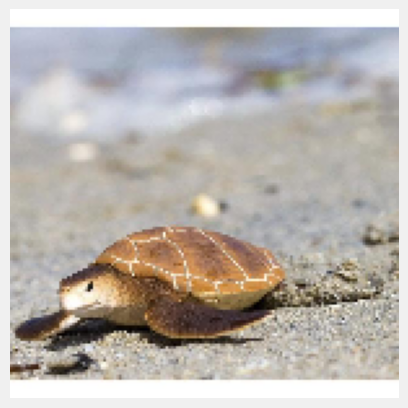

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.82240057


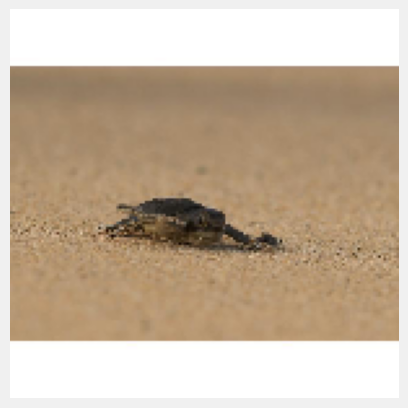

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.984863


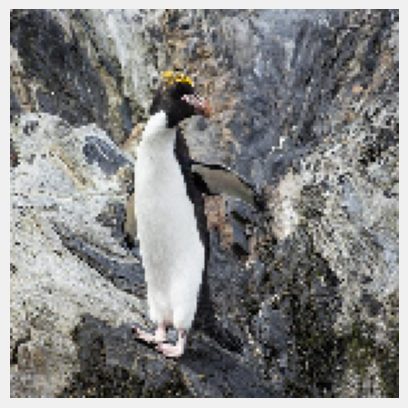

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.00571937


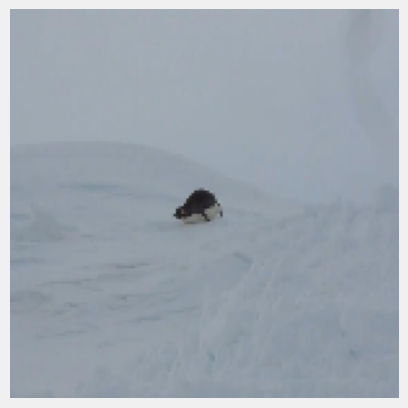

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.030285751


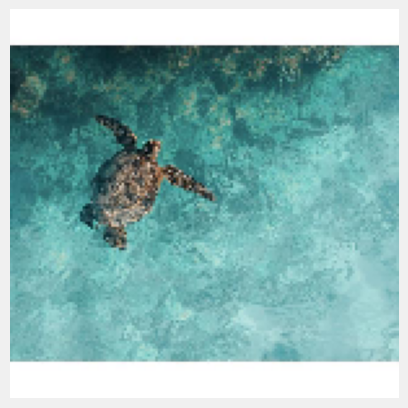

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.60568774


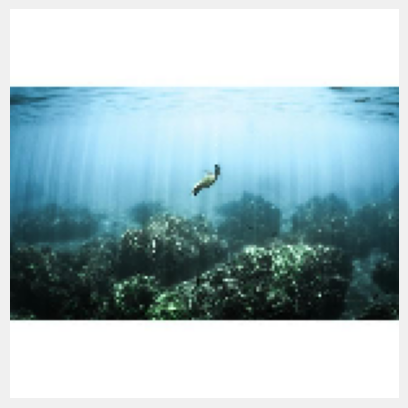

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9367102


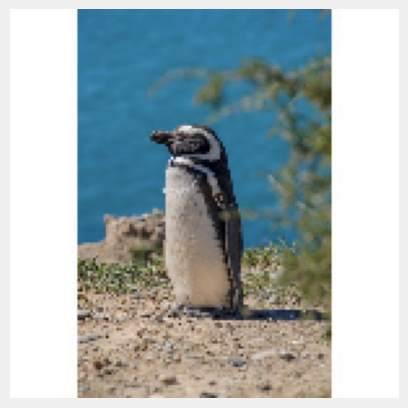

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.09018841


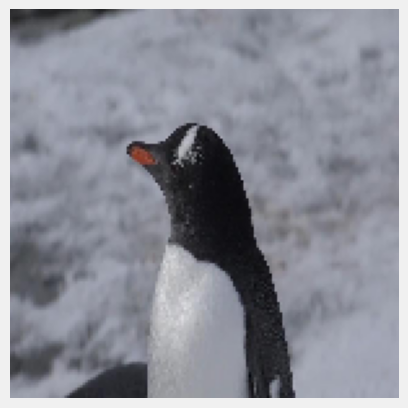

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0028546073


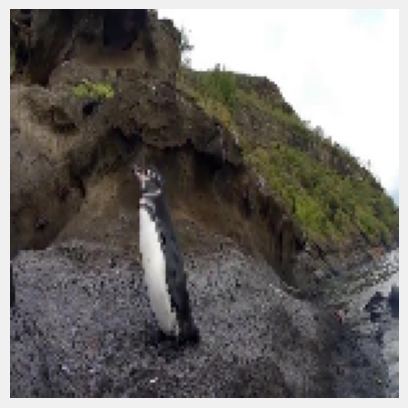

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.30212933


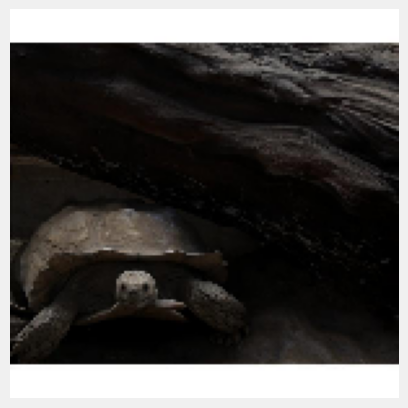

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.81938785


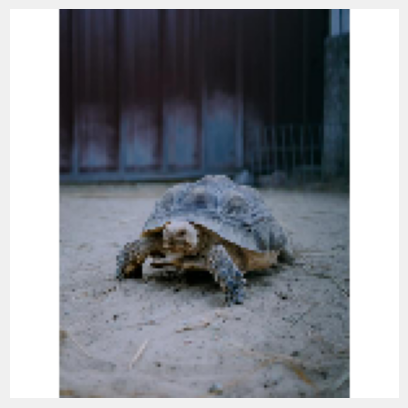

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.96928006


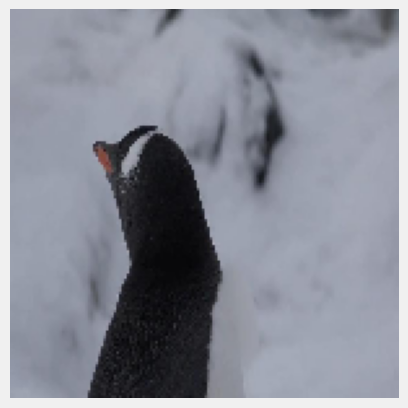

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0065324563


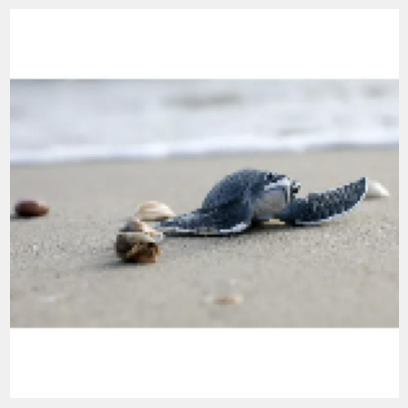

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.90382516


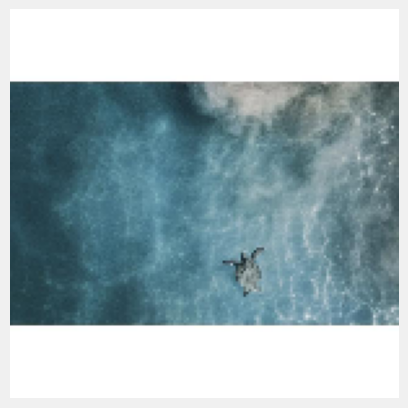

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.87783533


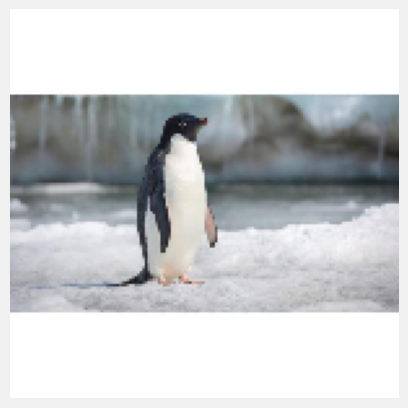

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.017786456


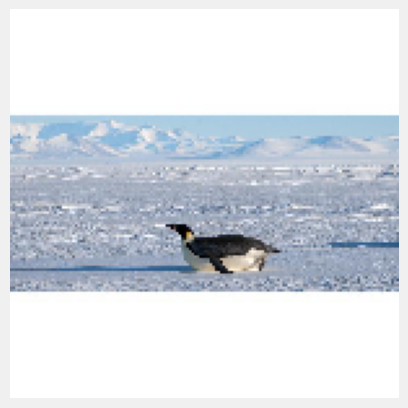

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.92181945


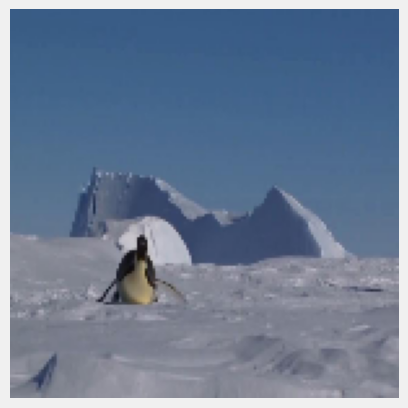

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.12911962


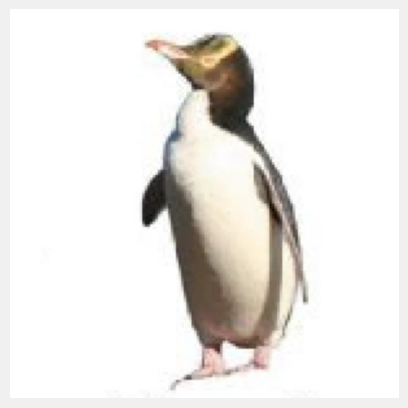

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.00082134316


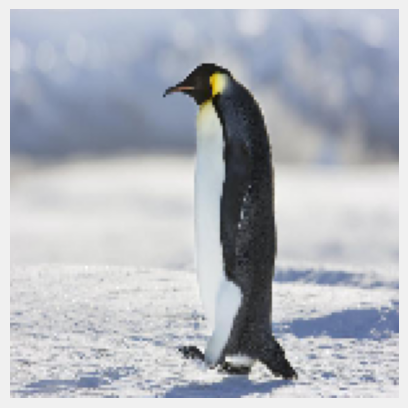

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.00037432055


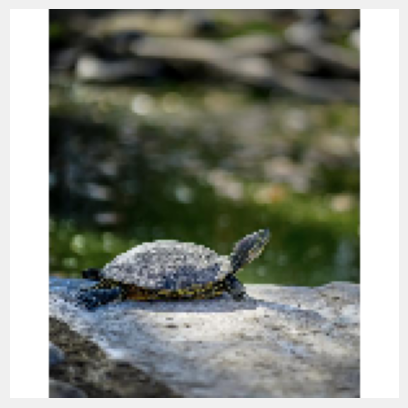

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9563855


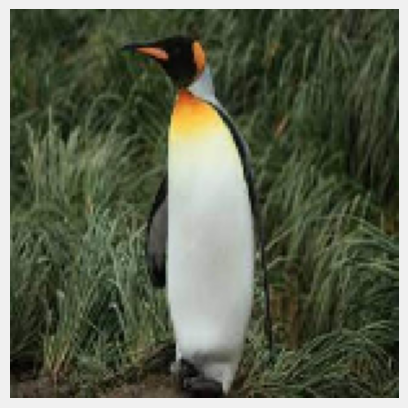

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.007706378


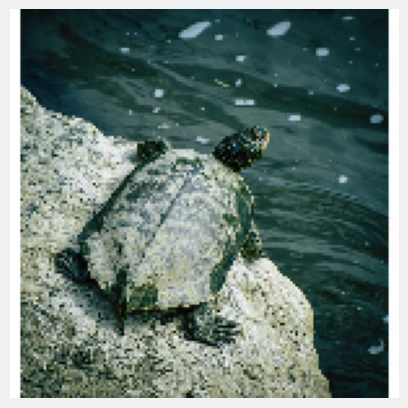

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.45838928


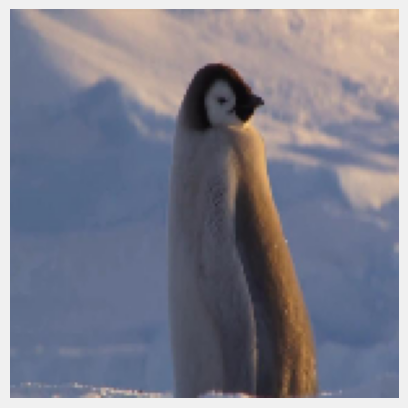

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0330702


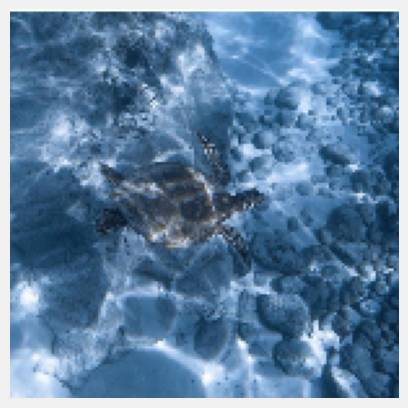

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.30041072


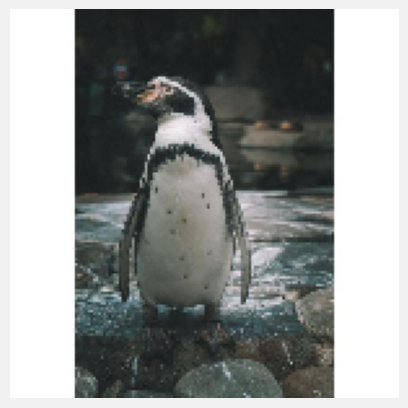

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.007916105


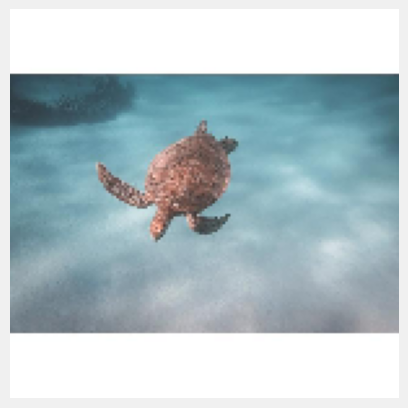

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.4962875


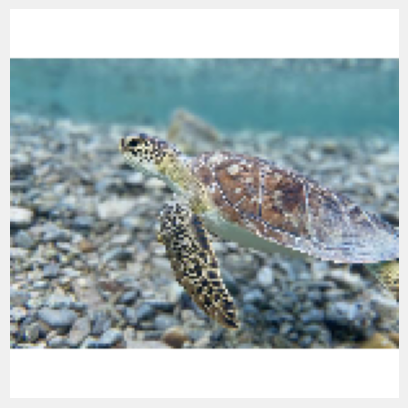

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9034495


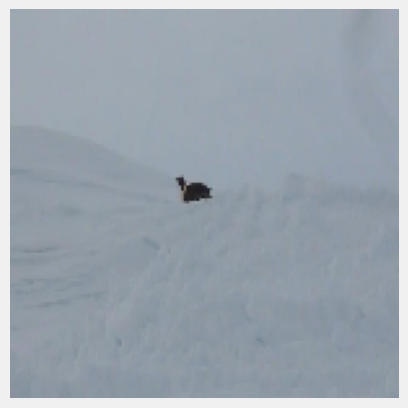

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.020144204


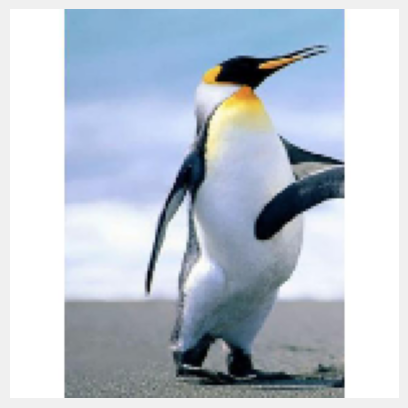

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0002246238


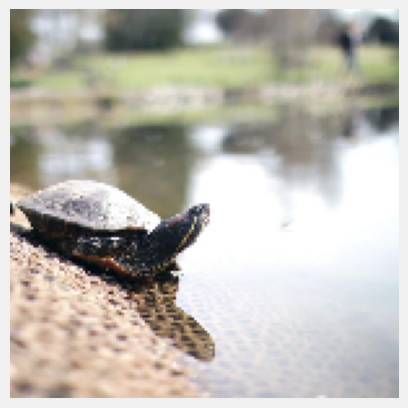

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.38512632


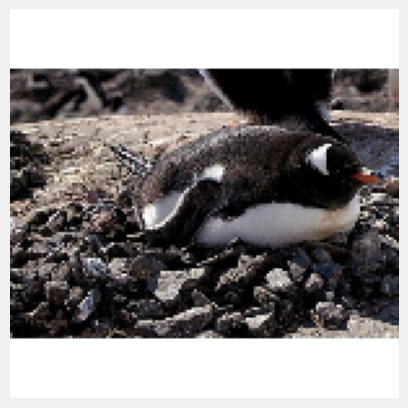

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.99642354


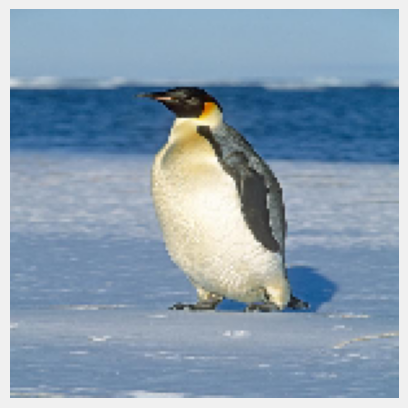

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0010338653


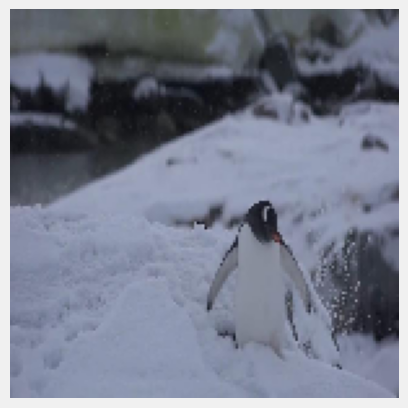

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.001906572


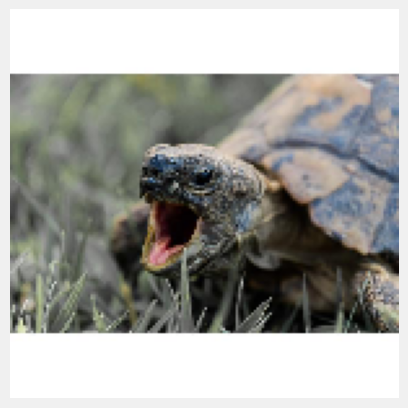

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.8862807


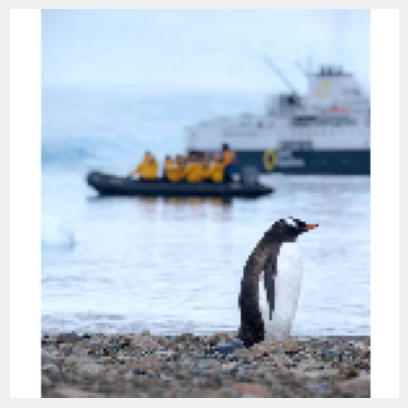

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.018959843


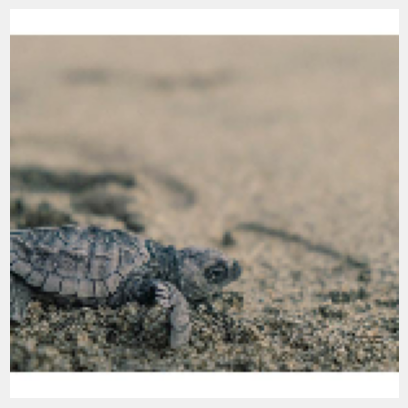

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.39556354


In [74]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Penguin', 'Turtle']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a id_images e o Classification
        id_images = batch[0]
        Classification = batch[1]

        # Previsão
        predictions = model.predict(id_images)

        # Visualização da imagem
        for i in range(len(id_images)):

            image = id_images[i]
            label = Classification[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Turtle' if prediction >= 0.5 else 'Penguin'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(id_images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

## Avaliação do modelo de deep learning

Acurácia do modelo nos dados de teste 82 %

In [68]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-68-78954c843b8c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(test_generator)


Test: accuracy = 0.820000  ;  loss = 0.473522 


Acurácia do modelo nos dados de validação 85,71%

In [69]:
loss, accuracy = model.evaluate_generator(val_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-69-596b50fdfe64>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(val_generator)


Test: accuracy = 0.642857  ;  loss = 0.786606 


### Visualização de métricas da avaliação do modelo

Métricas de performance do modelo no subconjunto das imagens de teste

*  Acurácia: indica uma performance geral do modelo. Dentre todas as
classificações, quantas o modelo classificou corretamente;
*  Precisão: dentre todas as classificações de classe Positivo que o modelo fez, quantas estão corretas;
*   Recall: dentre todas as situações de classe Positivo como valor esperado, quantas estão corretas; pode ser usada em uma situação em que os Falsos Negativos são considerados mais prejudiciais que os Falsos Positivos
*  F1-Score: média harmônica entre precisão e recall. Quando tem-se um F1-Score baixo, é um indicativo de que ou a precisão ou o recall está baixo.



In [67]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.82
Precision:  0.8208000000000001
Recall:  0.82
F1 Score:  0.8200720288115246


# Exportação do modelo de deep learning para posterior uso

In [75]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/penguins_vs_turtles/trained_models' # Caminho do modelo treinado

name_model = 'trained_model_' + formatted_datetime + '.h5' # Nomeando o modelo

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-22T2153.h5


# Teste do modelo exportado

In [76]:
# Carregando o modelo salvo
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-22T2153.h5 carregado com sucesso


2/2 [==============================] - 1s 222ms/step


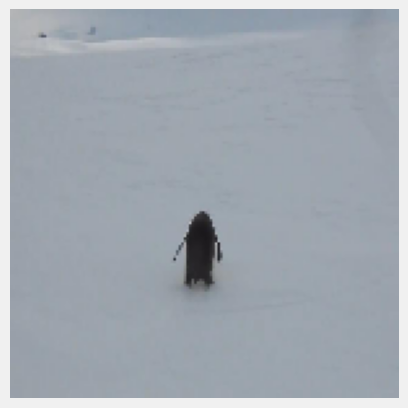

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.08119244


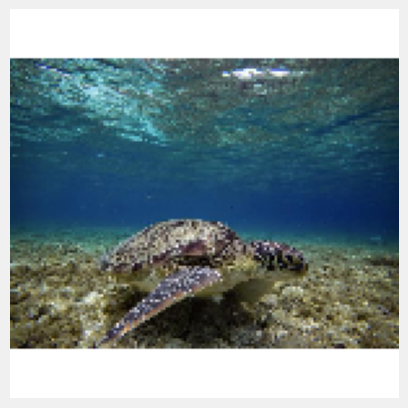

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.32248884


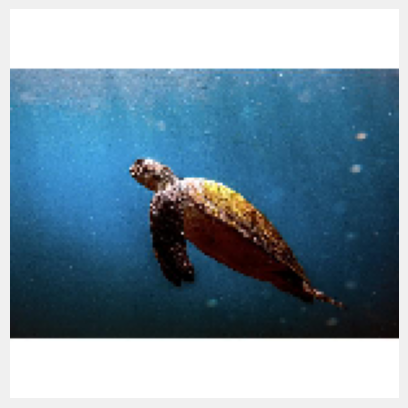

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99658275


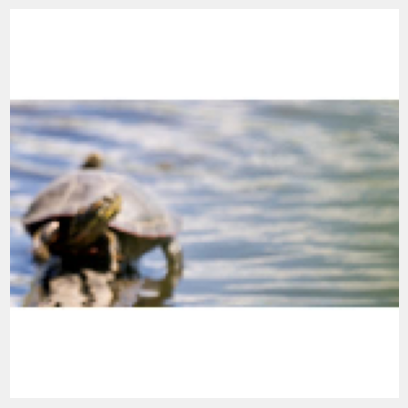

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99492484


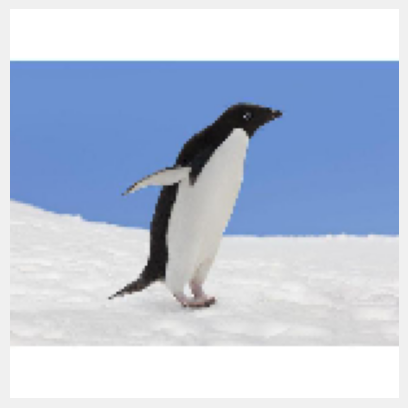

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.05033308


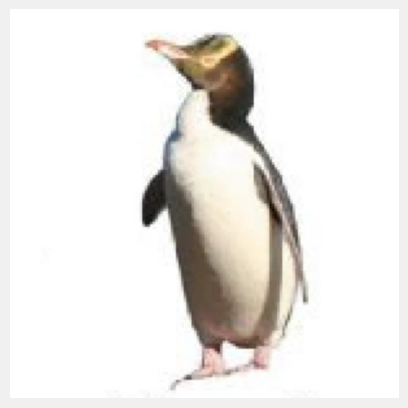

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.138343


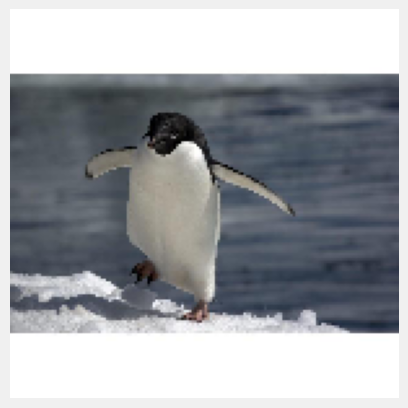

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.001389061


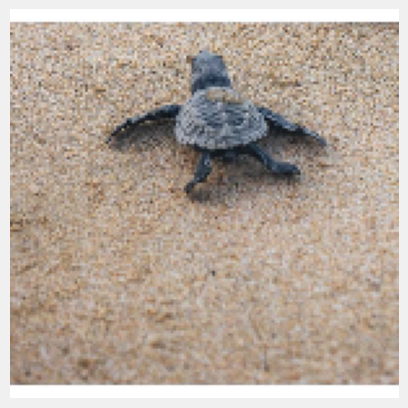

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.94158053


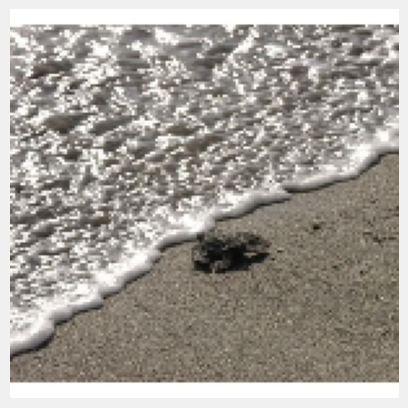

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9793822


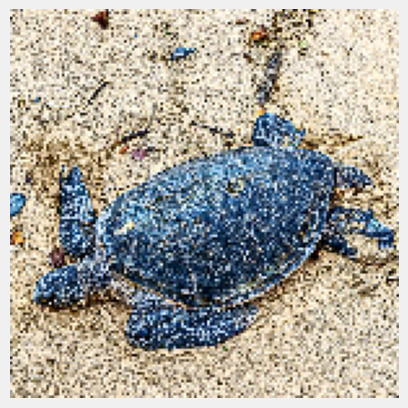

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.6725509


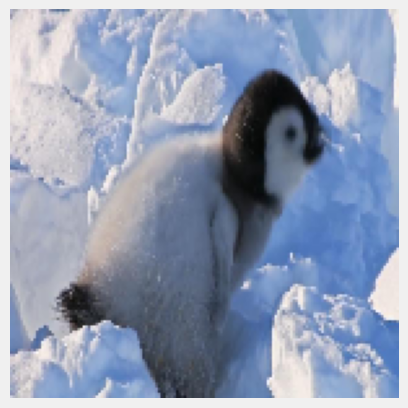

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.023806864


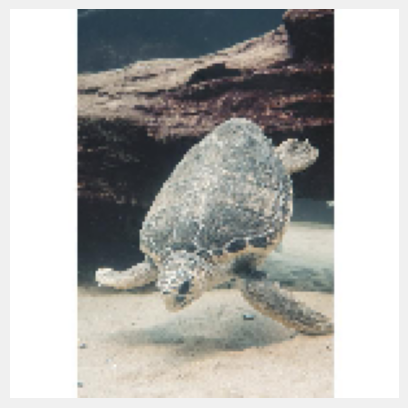

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9870824


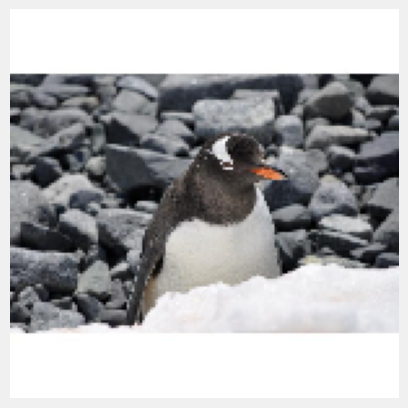

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.62031484


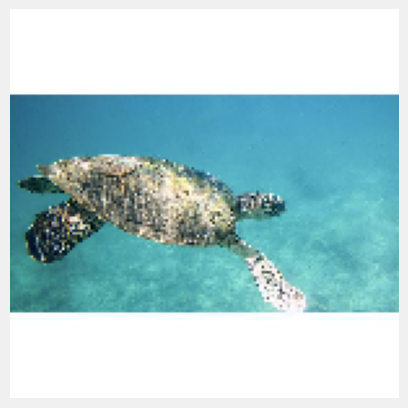

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9772232


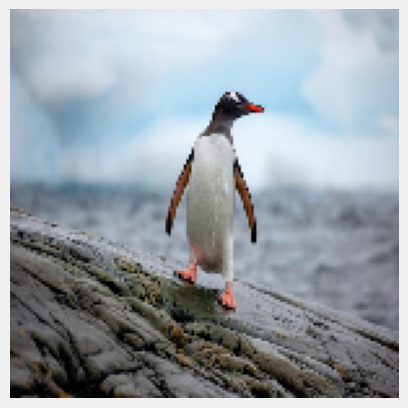

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.82240057


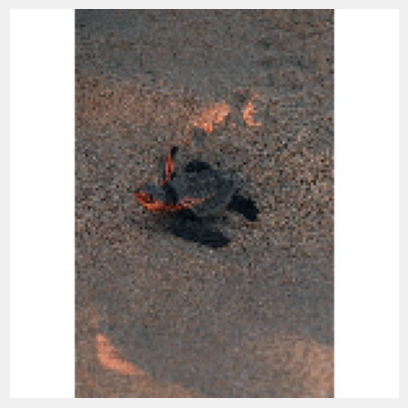

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.984863


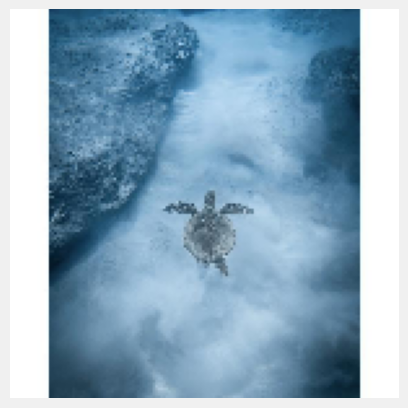

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.00571937


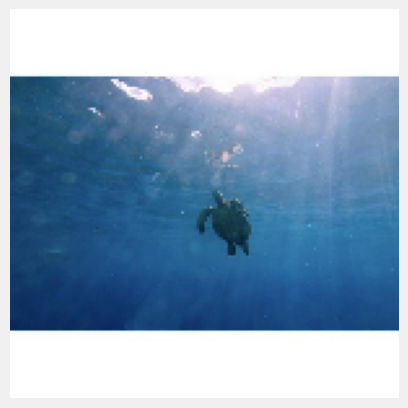

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.030285751


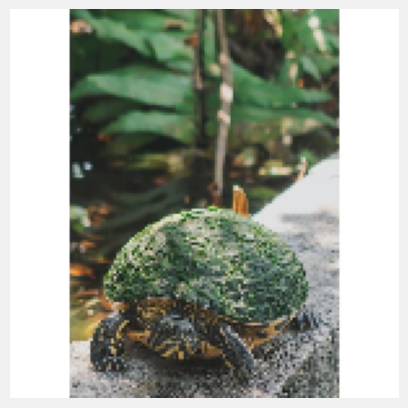

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.60568774


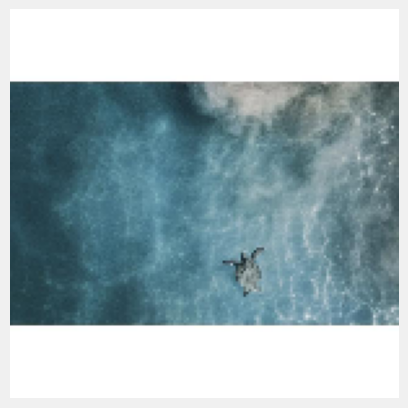

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9367102


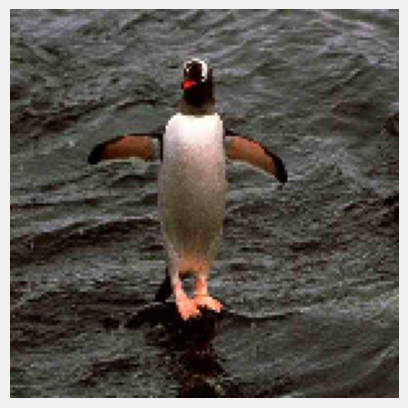

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.09018841


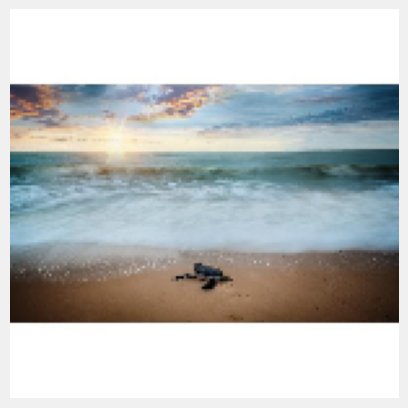

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.0028546073


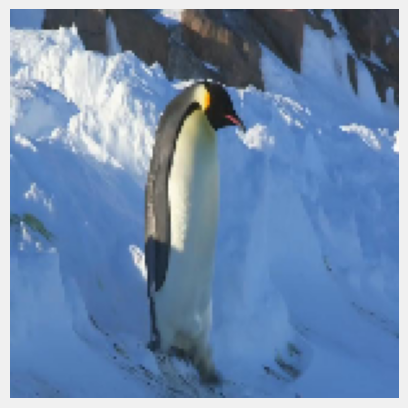

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.30212933


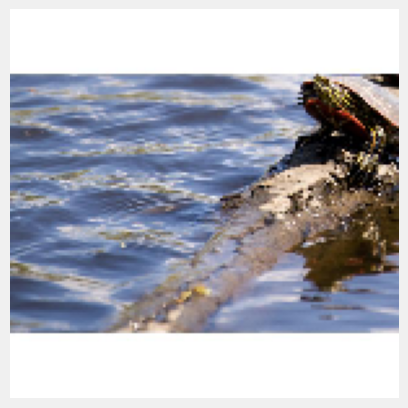

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.81938785


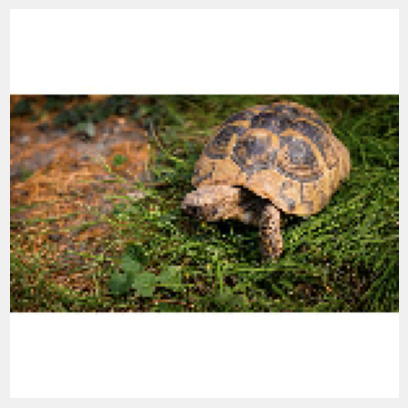

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.96928006


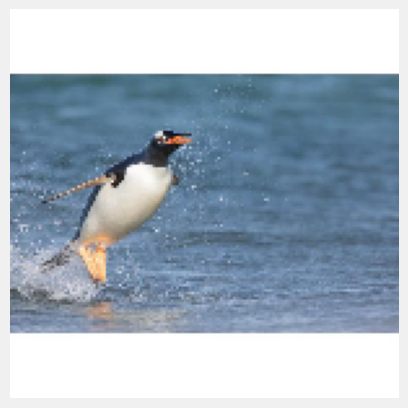

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0065324563


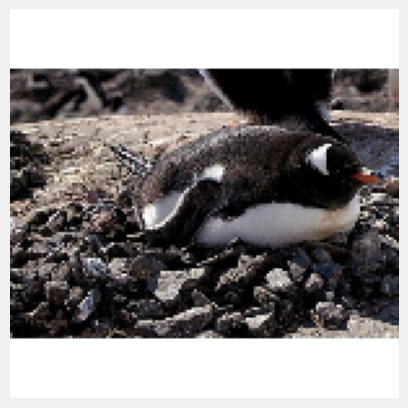

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.90382516


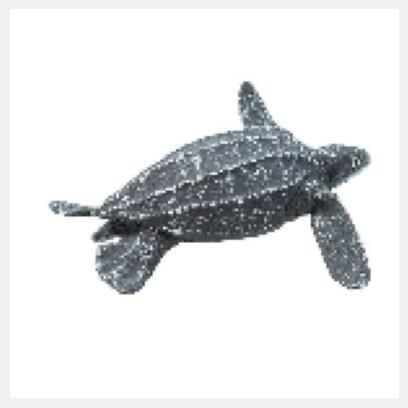

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.87783533


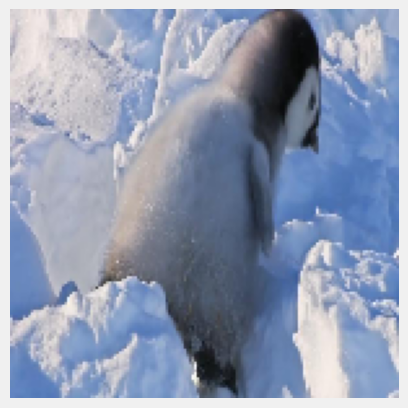

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.017786456


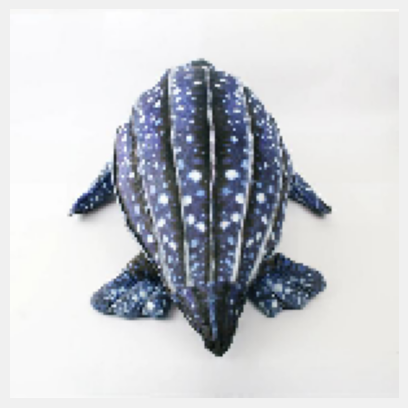

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.92181945


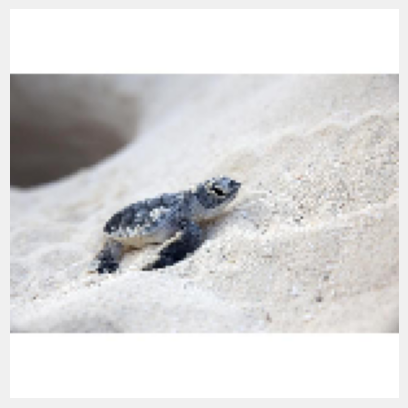

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.12911962


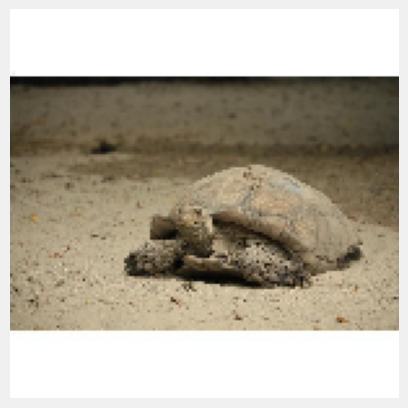

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.00082134316


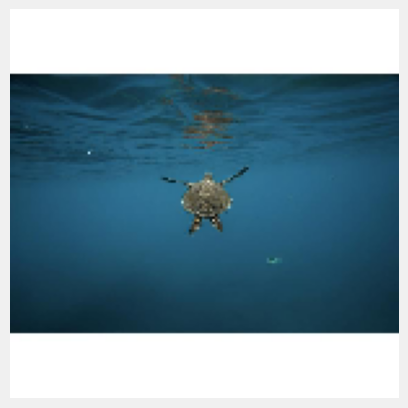

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.00037432055


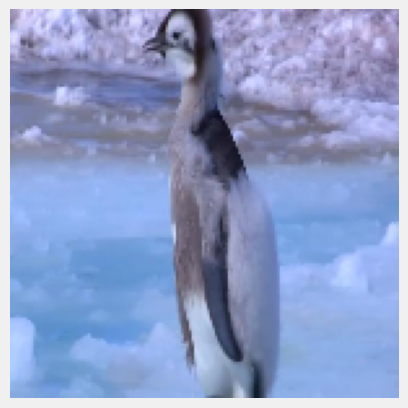

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.9563855


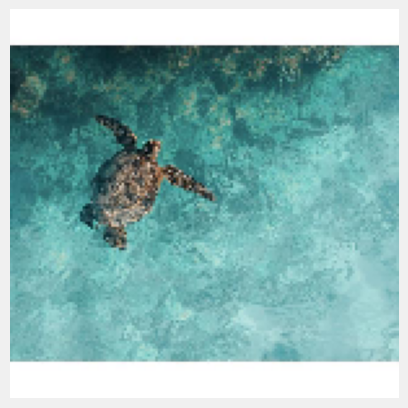

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.007706378


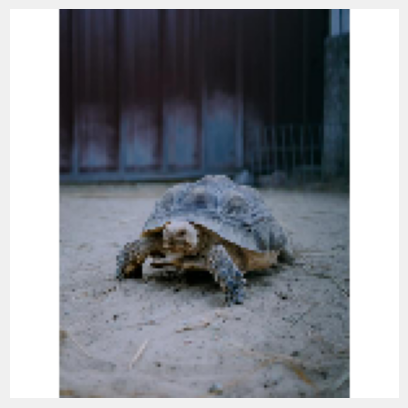

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.45838928


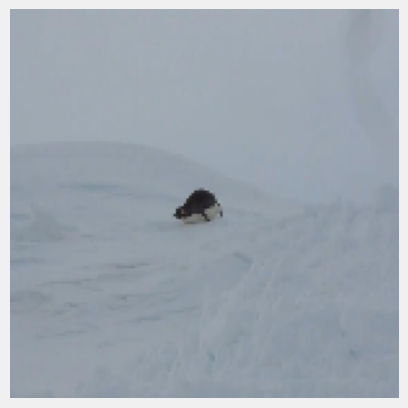

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0330702


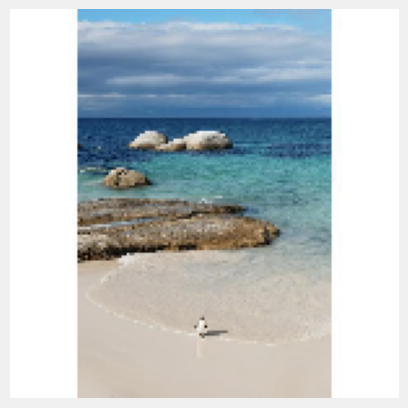

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.30041072


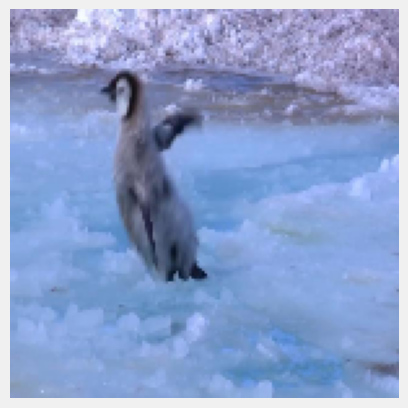

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.007916105


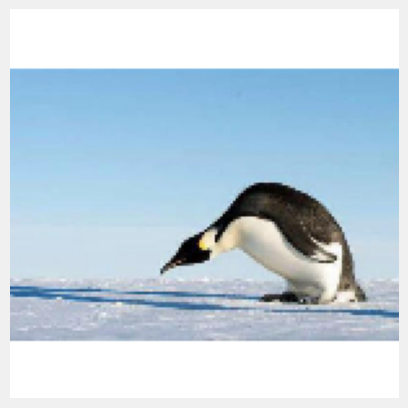

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.4962875


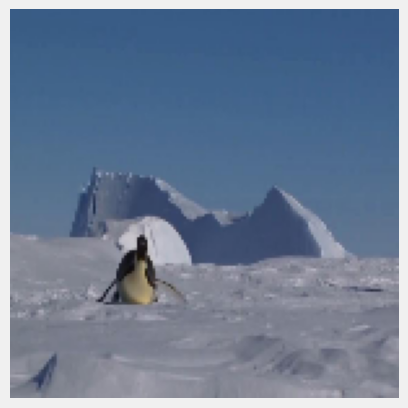

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.9034495


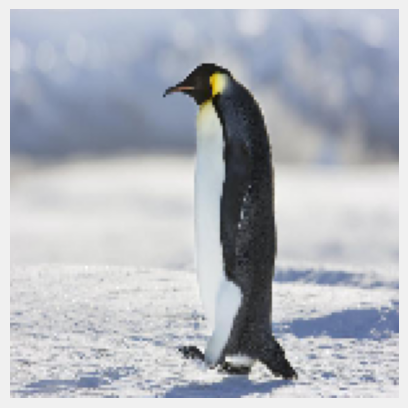

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.020144204


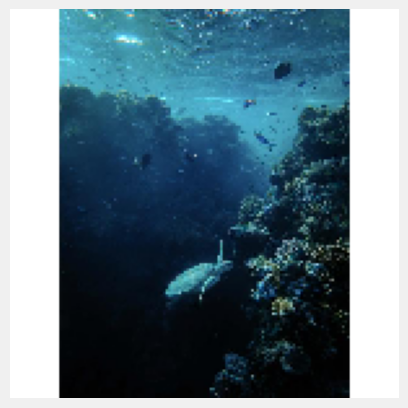

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.0002246238


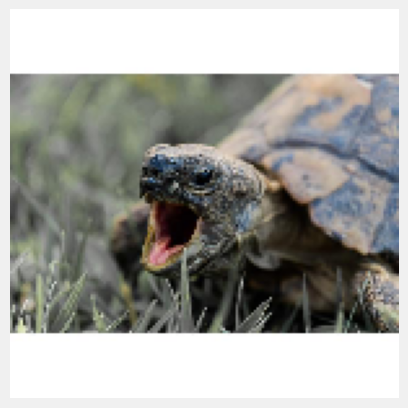

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.38512632


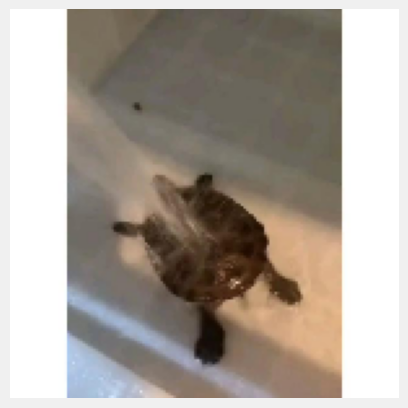

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99642354


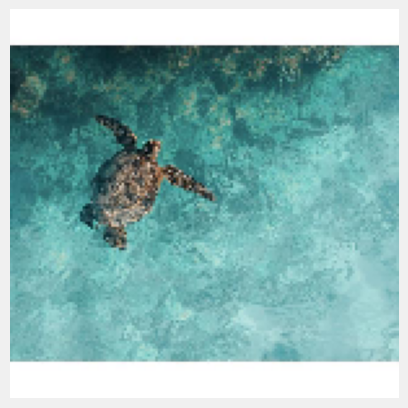

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.0010338653


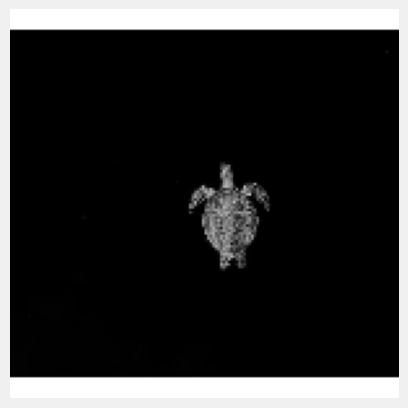

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.001906572


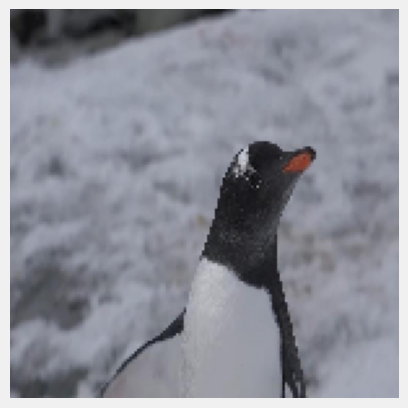

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.8862807


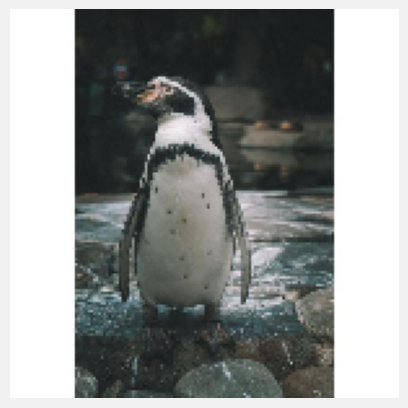

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.018959843


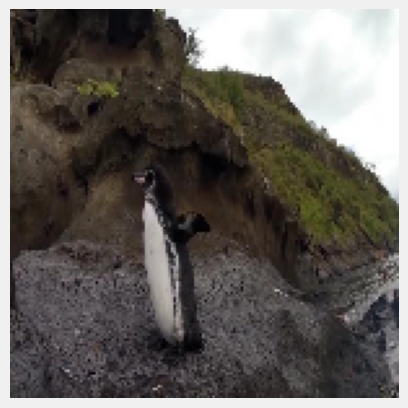

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.39556354


In [78]:
# Execução do modelo em um subconjunto de imagens de teste

count = 0
y_pred = list()
y_true = list()
class_names = ['Penguin', 'Turtle']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        Classification = batch[1]

        # Previsão
        predictions = loaded_model.predict(id_images)

        # Visualização da imagem
        for i in range(len(id_images)):

            image = id_images[i]
            label = Classification[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Turtle' if prediction >= 0.5 else 'Penguin'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)